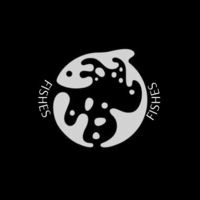
<h1><strong><center>Unveiling the Kitchen Secrets
<strong/></h1>


---
<h3>Tím: Fishes in the Data Kitchen</h3>

- Zuzana Kováčová
- Kristína Galková
- Jana Poľašková
- Simona Bednáriková


---
Odbor: DAV





In [ ]:
import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
import numpy as np
import matplotlib.patches as mpatches
from matplotlib import cm
import networkx as nx
import math

# 1. Nacitanie dat

In [ ]:
url = "https://raw.githubusercontent.com/ZuzkaK11/Fishes-in-the-kitchen/refs/heads/main/recipes.csv"
bipartite_df = pd.read_csv(url)

print(bipartite_df.head())


   African        chicken  cinnamon    soy_sauce     onion    ginger  \
0  African  cane_molasses    ginger        cumin    garlic  tamarind   
1  African         butter    pepper        onion  cardamom   cayenne   
2  African      olive_oil    pepper        wheat      beef     onion   
3  African          honey     wheat        yeast       NaN       NaN   
4  African         tomato  cilantro  lemon_juice     onion   cayenne   

  Unnamed: 6      Unnamed: 7 Unnamed: 8 Unnamed: 9  ... Unnamed: 23  \
0      bread       coriander    vinegar      onion  ...         NaN   
1     ginger  cottage_cheese     garlic   brassica  ...         NaN   
2   cardamom           cumin     garlic       rice  ...         NaN   
3        NaN             NaN        NaN        NaN  ...         NaN   
4   scallion             NaN        NaN        NaN  ...         NaN   

  Unnamed: 24 Unnamed: 25 Unnamed: 26 Unnamed: 27 Unnamed: 28 Unnamed: 29  \
0         NaN         NaN         NaN         NaN         NaN  

<ipython-input-2-182b31a8e75d>:2: DtypeWarning: Columns (30,31,32) have mixed types. Specify dtype option on import or set low_memory=False.
  bipartite_df = pd.read_csv(url)


In [ ]:
# prvi column je Region a potom ingrediencia1,2...x
bipartite_df.columns = ['Region'] + [f'Ingredient_{i}' for i in range(1, len(bipartite_df.columns))]
B = nx.Graph()

for _, row in bipartite_df.iterrows():
    region = row["Region"]
    for ingredient in row[1:]:
        if pd.notna(ingredient):  # nan filtering
            B.add_node(region, bipartite=0)  # Region as one partition
            B.add_node(ingredient, bipartite=1)  # Ingredient as another partition

            if B.has_edge(region, ingredient):
                B[region][ingredient]['weight'] += 1
            else:
                B.add_edge(region, ingredient, weight=1)

print("Nodes:", B.nodes(data=True))
print("Edges:", B.edges(data=True))

Nodes: [('African', {'bipartite': 0}), ('cane_molasses', {'bipartite': 1}), ('ginger', {'bipartite': 1}), ('cumin', {'bipartite': 1}), ('garlic', {'bipartite': 1}), ('tamarind', {'bipartite': 1}), ('bread', {'bipartite': 1}), ('coriander', {'bipartite': 1}), ('vinegar', {'bipartite': 1}), ('onion', {'bipartite': 1}), ('beef', {'bipartite': 1}), ('cayenne', {'bipartite': 1}), ('parsley', {'bipartite': 1}), ('wheat_bread', {'bipartite': 1}), ('yogurt', {'bipartite': 1}), ('vegetable_oil', {'bipartite': 1}), ('egg', {'bipartite': 1}), ('butter', {'bipartite': 1}), ('pepper', {'bipartite': 1}), ('cardamom', {'bipartite': 1}), ('cottage_cheese', {'bipartite': 1}), ('brassica', {'bipartite': 1}), ('olive_oil', {'bipartite': 1}), ('wheat', {'bipartite': 1}), ('rice', {'bipartite': 1}), ('leek', {'bipartite': 1}), ('honey', {'bipartite': 1}), ('yeast', {'bipartite': 1}), ('tomato', {'bipartite': 1}), ('cilantro', {'bipartite': 1}), ('lemon_juice', {'bipartite': 1}), ('scallion', {'bipartite': 

# 2. Zakladne statistiky

In [ ]:
#total
num_nodes = B.number_of_nodes()
num_edges = B.number_of_edges()

region_nodes = [node for node, data in B.nodes(data=True) if data['bipartite'] == 0]
ingredient_nodes = [node for node, data in B.nodes(data=True) if data['bipartite'] == 1]

num_regions = len(region_nodes)
num_ingredients = len(ingredient_nodes)

# Degree distribution
region_degrees = [B.degree(node) for node in region_nodes]
ingredient_degrees = [B.degree(node) for node in ingredient_nodes]

# Density
density = num_edges / (num_regions * num_ingredients) if num_regions > 0 and num_ingredients > 0 else 0

# Average degree
avg_degree_regions = sum(region_degrees) / num_regions if num_regions > 0 else 0
avg_degree_ingredients = sum(ingredient_degrees) / num_ingredients if num_ingredients > 0 else 0

# Number of connected components
num_connected_components = nx.number_connected_components(B)


print("Basic Bipartite Graph Statistics:")
print(f"Total Nodes: {num_nodes}")
print(f"Total Edges: {num_edges}")
print(f"Number of Regions (Partition 0): {num_regions}")
print(f"Number of Ingredients (Partition 1): {num_ingredients}")
print(f"Density: {density:.4f}")
print(f"Average Degree (Regions): {avg_degree_regions:.2f}")
print(f"Average Degree (Ingredients): {avg_degree_ingredients:.2f}")
print(f"Number of Connected Components: {num_connected_components}")


Basic Bipartite Graph Statistics:
Total Nodes: 392
Total Edges: 2641
Number of Regions (Partition 0): 11
Number of Ingredients (Partition 1): 381
Density: 0.6302
Average Degree (Regions): 240.09
Average Degree (Ingredients): 6.93
Number of Connected Components: 1


In [ ]:
# Region statisitky

region_stats = []
recipe_counts = bipartite_df['Region'].value_counts().to_dict()

for region in [node for node, data in B.nodes(data=True) if data['bipartite'] == 0]:
    degree = B.degree(region)
    total_weight = sum(B[region][ingredient]['weight'] for ingredient in B.neighbors(region))

    num_recipes = recipe_counts.get(region, 0)

    region_stats.append({
        'Region': region,
        'Unique Ingredients': degree,
        'Total Ingredients': total_weight,
        'Number of Recipes': num_recipes,
        'Average Ingredients per Recipe': total_weight / num_recipes if num_recipes > 0 else 0
    })

region_stats_df = pd.DataFrame(region_stats)
print("\nRegion Statistics:")
print(region_stats_df)


Region Statistics:
              Region  Unique Ingredients  Total Ingredients  \
0            African                 197               3674   
1          EastAsian                 242              22498   
2    EasternEuropean                 198               3196   
3      LatinAmerican                 260              27360   
4      MiddleEastern                 227               5411   
5      NorthAmerican                 354             330618   
6   NorthernEuropean                 175               1706   
7         SouthAsian                 205               6388   
8     SoutheastAsian                 184               5172   
9   SouthernEuropean                 290              37038   
10   WesternEuropean                 309              21341   

    Number of Recipes  Average Ingredients per Recipe  
0                 351                       10.467236  
1                2512                        8.956210  
2                 381                        8.388451  

In [ ]:
#ingredients statistic
ingredient_stats = []
for ingredient in [node for node, data in B.nodes(data=True) if data['bipartite'] == 1]:
    degree = B.degree(ingredient)
    unique_regions = len(set(B.neighbors(ingredient)))
    total_weight = sum(B[region][ingredient]['weight'] for region in B.neighbors(ingredient))

    ingredient_stats.append({
        'Ingredient': ingredient,
        'Degree': degree,
        'Unique Regions': unique_regions,
        'Total Weight': total_weight
    })

ingredient_stats_df = pd.DataFrame(ingredient_stats)
print("\nIngredient Statistics:")
print(ingredient_stats_df)


Ingredient Statistics:
           Ingredient  Degree  Unique Regions  Total Weight
0       cane_molasses      11              11          7655
1              ginger      11              11          3815
2               cumin      11              11          3220
3              garlic      11              11         16893
4            tamarind      11              11          1663
..                ...     ...             ...           ...
376      sheep_cheese       2               2             2
377    strawberry_jam       1               1             1
378  strawberry_juice       1               1             2
379      jamaican_rum       1               1             1
380   emmental_cheese       1               1             1

[381 rows x 4 columns]


# Unikatne ingredience na recept

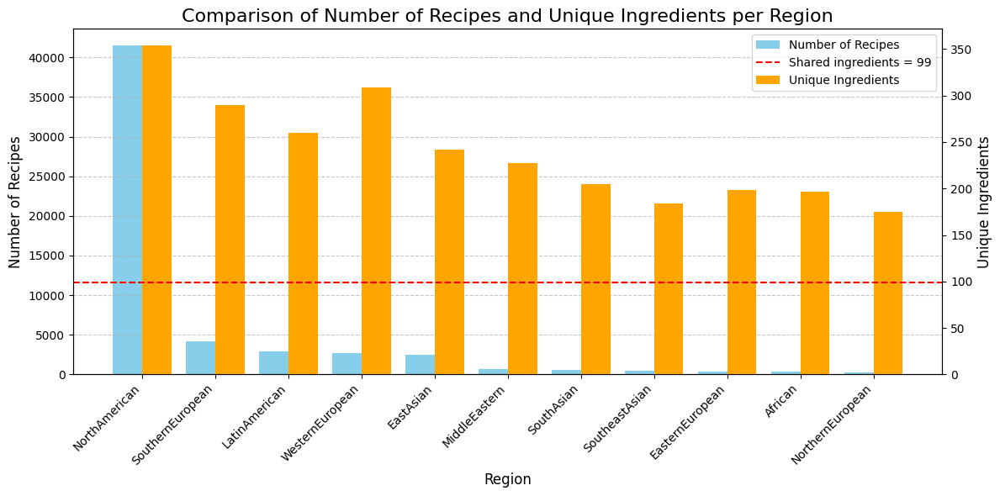

In [ ]:
region_stats_df = pd.DataFrame(region_stats)

region_stats_df = region_stats_df.sort_values('Number of Recipes', ascending=False)

x_indices = np.arange(len(region_stats_df))
#fig
fig, ax1 = plt.subplots(figsize=(12, 6))

bar1 = ax1.bar( x_indices - 0.2,   region_stats_df['Number of Recipes'], width=0.4, color='skyblue', label='Number of Recipes')
ax2 = ax1.twinx()
bar2 = ax2.bar( x_indices + 0.2, region_stats_df['Unique Ingredients'], width=0.4, color='orange', label='Unique Ingredients')

#labels
ax1.set_ylabel('Number of Recipes', fontsize=12)
ax1.set_xlabel('Region', fontsize=12)
ax2.set_ylabel('Unique Ingredients', fontsize=12)
ax2.axhline(y=99, color='red', linestyle='--', label='Shared ingredients = 99')
ax1.set_xticks(x_indices)
ax1.set_xticklabels(region_stats_df['Region'], rotation=45, ha='right')

plt.title("Comparison of Number of Recipes and Unique Ingredients per Region", fontsize=16)
fig.legend(loc="upper right", bbox_to_anchor=(1, 1), bbox_transform=ax1.transAxes)


ax1.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()


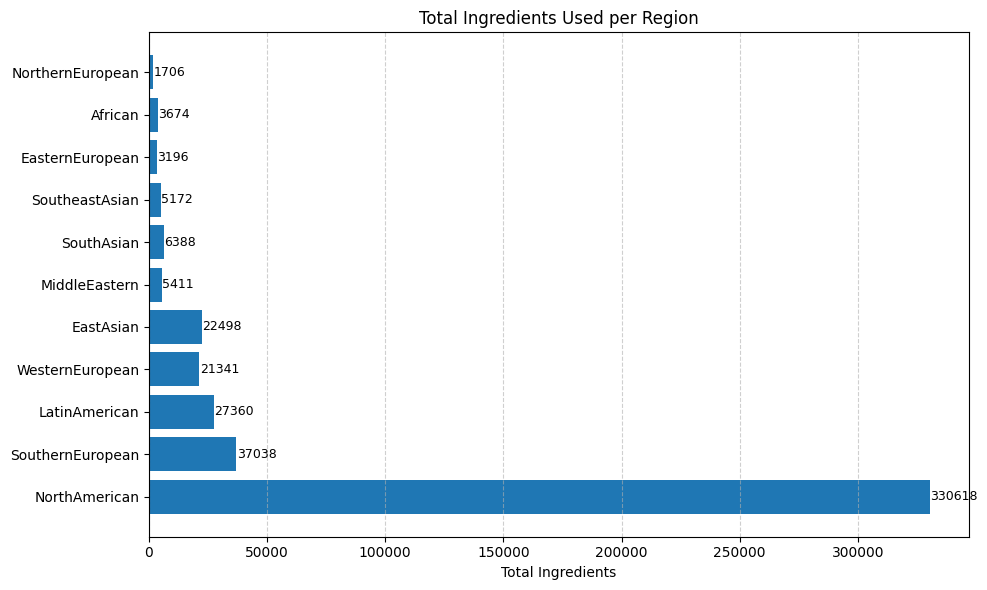

In [ ]:
plt.figure(figsize=(10, 6))
bars = plt.barh(region_stats_df['Region'], region_stats_df['Total Ingredients'])
plt.xlabel('Total Ingredients')
plt.title('Total Ingredients Used per Region')

# Čísla na konci barov
for bar in bars:
    width = bar.get_width()
    plt.text(width + 100, bar.get_y() + bar.get_height() / 2, f'{int(width)}',
             va='center', fontsize=9)

plt.grid(axis='x', linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()


<ipython-input-9-fec5e5f694ee>:35: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend( scatterpoints=1, loc='upper left', title='Bubble size = Total Ingredients', frameon=True )


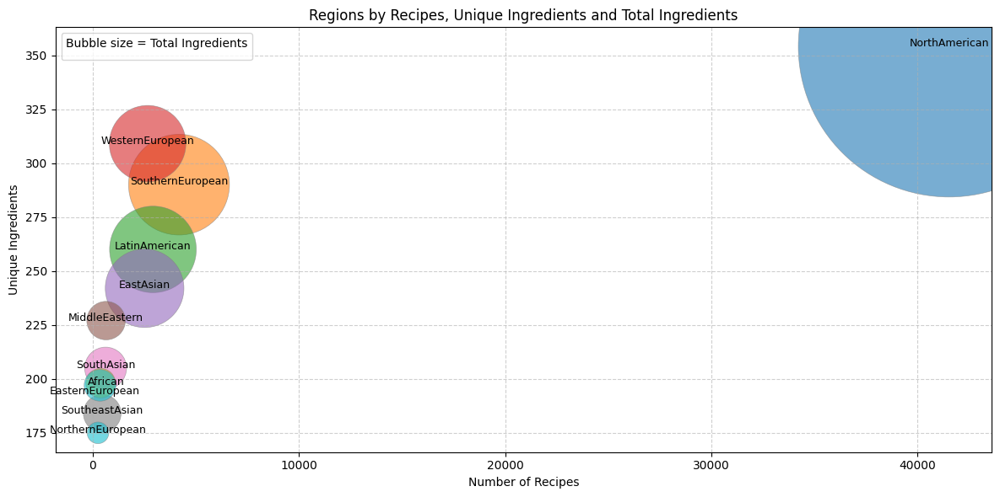

In [ ]:
plt.figure(figsize=(12, 6))

# Bubble scatter plot
scatter = plt.scatter(
    region_stats_df['Number of Recipes'],
    region_stats_df['Unique Ingredients'],
    s=region_stats_df['Total Ingredients'] / 5,
    alpha=0.6,
    c=np.arange(len(region_stats_df)),
    cmap='tab10',
    edgecolors='grey',
    linewidths=0.5
)

for i, row in region_stats_df.iterrows():
    x = row['Number of Recipes']
    y = row['Unique Ingredients']
    label = row['Region']

    if label == 'African':
        plt.text(x + 300, y, label, fontsize=9, ha='center')
    elif label == 'EasternEuropean':
        plt.text(x - 300, y - 5, label, fontsize=9, ha='center')
    else:
        plt.text(x, y, label, fontsize=9, ha='center')


# lables
plt.xlabel('Number of Recipes')
plt.ylabel('Unique Ingredients')
plt.title('Regions by Recipes, Unique Ingredients and Total Ingredients')

legend_sizes = [500, 1000, 2000]
legend_bubbles = [ plt.scatter([], [], s=size / 5, color='gray', alpha=0.5) for size in legend_sizes ]
plt.legend( scatterpoints=1, loc='upper left', title='Bubble size = Total Ingredients', frameon=True )

plt.grid(True, linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()


In [ ]:
!pip install squarify

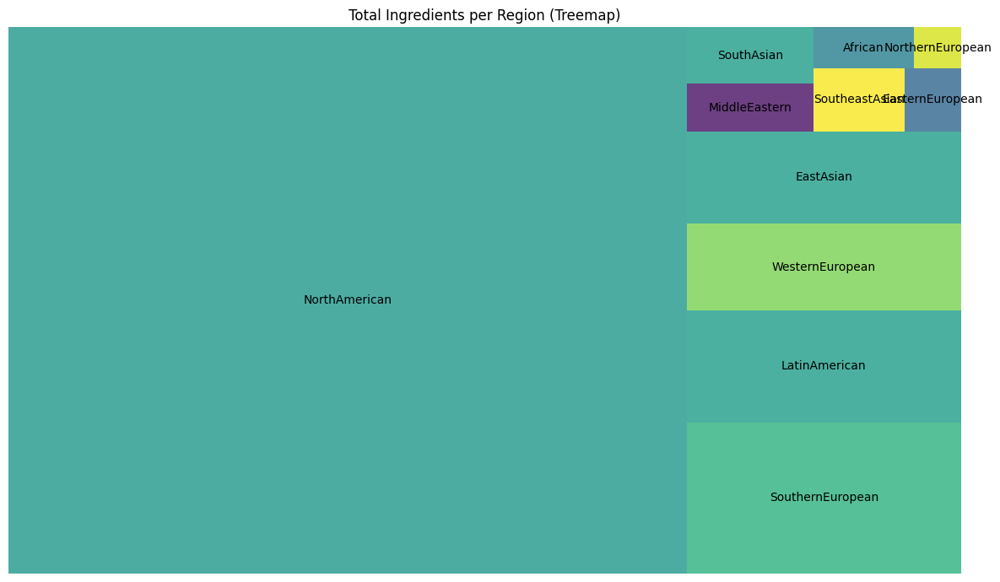

In [ ]:
import squarify

plt.figure(figsize=(12, 7))
squarify.plot( sizes=region_stats_df['Total Ingredients'],label=region_stats_df['Region'],alpha=0.8 )
plt.title("Total Ingredients per Region (Treemap)")
plt.axis('off')
plt.tight_layout()
plt.show()


# Pocet ingrediencii na recept

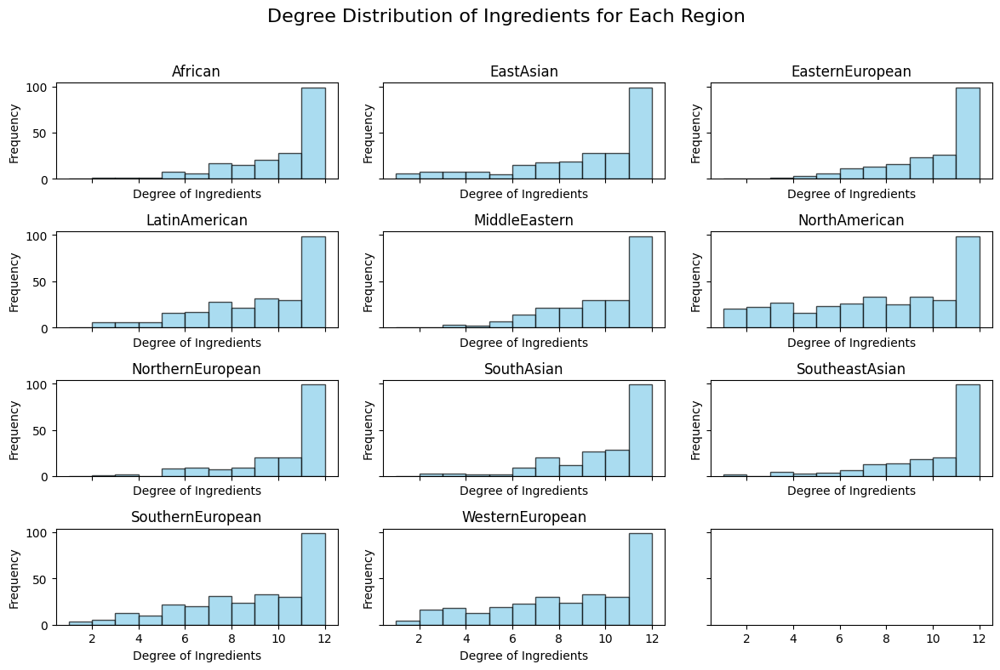

In [ ]:
degree_distribution_per_region = []

# regiony = 0
for region in [node for node, data in B.nodes(data=True) if data['bipartite'] == 0]:
    region_ingredients = set(B.neighbors(region))

    ingredient_degrees = [B.degree(ingredient) for ingredient in region_ingredients]

    degree_distribution_per_region.append({'Region': region, 'Degree Distribution': ingredient_degrees})

degree_distribution_df = pd.DataFrame(degree_distribution_per_region)

# rowa
n_regions = len(degree_distribution_df)
n_cols = 3
n_rows = (n_regions + n_cols - 1) // n_cols

#plot
fig, axes = plt.subplots(n_rows, n_cols, figsize=(12, 8), sharex=True, sharey=True)
axes = axes.flatten()

for idx, row in degree_distribution_df.iterrows():
    ax = axes[idx]
    ax.hist(row['Degree Distribution'], bins=range(1, max(row['Degree Distribution']) + 2), alpha=0.7, color='skyblue', edgecolor='black')

    # laabelsss
    ax.set_title(row['Region'], fontsize=12)
    ax.set_xlabel('Degree of Ingredients', fontsize=10)
    ax.set_ylabel('Frequency', fontsize=10)

plt.suptitle('Degree Distribution of Ingredients for Each Region', fontsize=16)
plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()


<ipython-input-14-87e6cd387756>:22: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap('viridis')


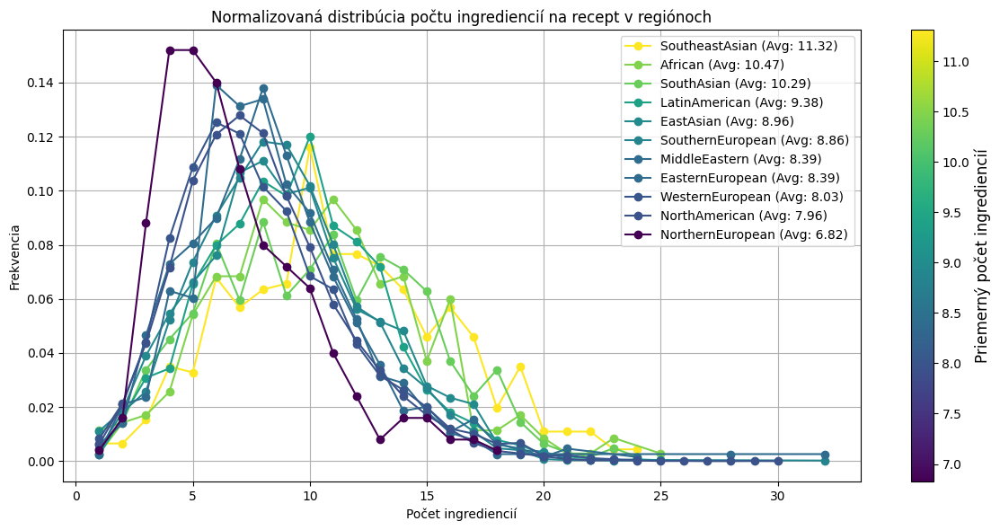

In [ ]:
normalized_distribution = {}
average_ingredients = {}

for region in bipartite_df['Region'].unique():
    region_recipes = bipartite_df[bipartite_df['Region'] == region] #filter by region

    ingredients_per_recipe = region_recipes.iloc[:, 1:].notna().sum(axis=1) #remove nan

    #normalize
    ingredient_counts = ingredients_per_recipe.value_counts().sort_index()
    normalized_distribution[region] = ingredient_counts / ingredient_counts.sum()

    average_ingredients[region] = ingredients_per_recipe.mean()


sorted_regions = sorted(average_ingredients.items(), key=lambda x: x[1], reverse=True)
sorted_region_names = [region for region, avg in sorted_regions]
sorted_avg_values = [avg for _, avg in sorted_regions]


norm = plt.Normalize(min(sorted_avg_values), max(sorted_avg_values))
cmap = cm.get_cmap('viridis')

plt.figure(figsize=(12, 6))

for region in sorted_region_names:
    distribution = normalized_distribution[region]
    avg_value = average_ingredients[region]
    plt.plot(
        distribution.index,
        distribution.values,
        marker='o',
        color=cmap(norm(avg_value)),
        label=f"{region} (Avg: {avg_value:.2f})"
    )


sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
sm.set_array([])
cbar = plt.colorbar(sm, ax=plt.gca())
cbar.set_label('Priemerný počet ingrediencií', fontsize=12)

plt.xlabel("Počet ingrediencií")
plt.ylabel("Frekvencia")
plt.title("Normalizovaná distribúcia počtu ingrediencií na recept v regiónoch")

plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


# Vykreslenie grafu

<ipython-input-15-559fac0fdfeb>:30: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = plt.cm.get_cmap('tab10', len(region_nodes))


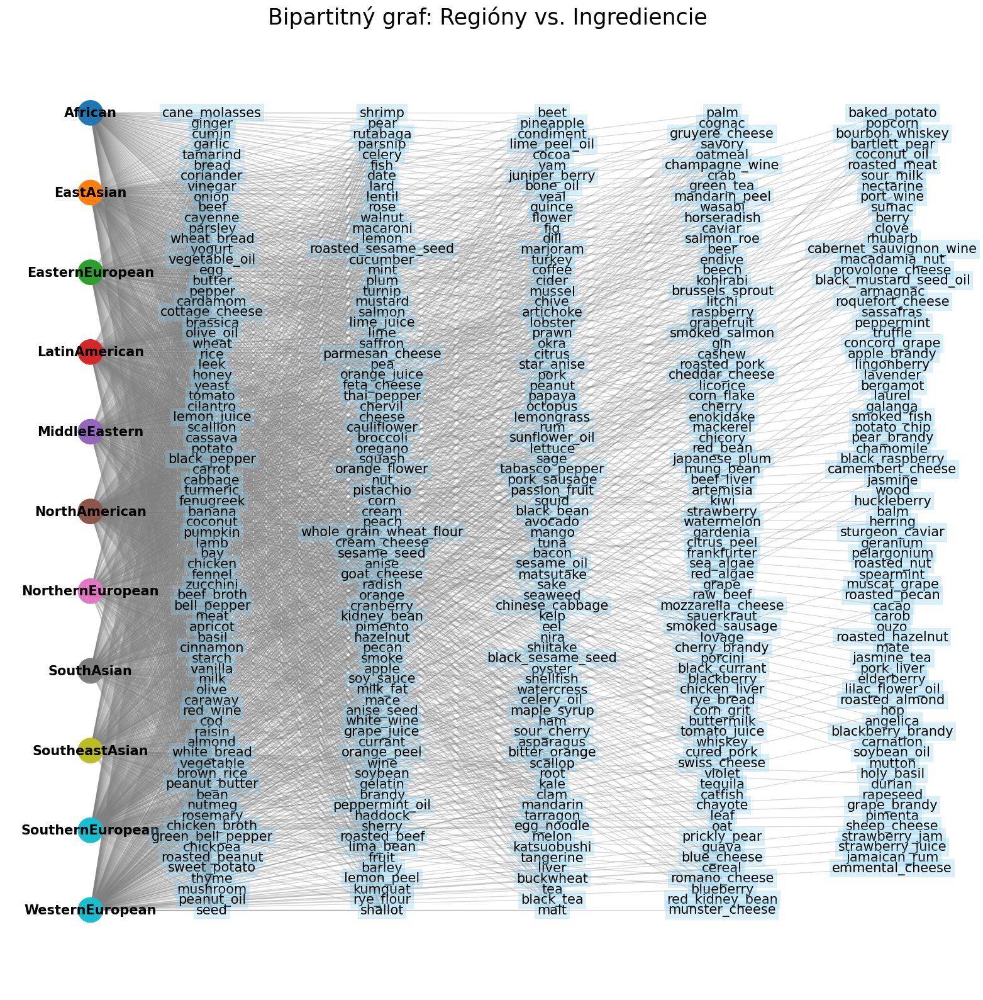

In [ ]:
weights = [data['weight'] for _, _, data in B.edges(data=True)]
avg_w = sum(weights) / len(weights) if weights else 0
edges = [(u, v) for u, v, data in B.edges(data=True) ]
Bf = B.edge_subgraph(edges).copy()

#uzly
region_nodes = [n for n,d in Bf.nodes(data=True) if d['bipartite']==0]
ing_nodes    = [n for n,d in Bf.nodes(data=True) if d['bipartite']==1]

pos = {}
# regiony vľavo
for i,n in enumerate(region_nodes):
    pos[n] = (0.0, 1 - i/(len(region_nodes)-1 if len(region_nodes)>1 else 1))
# ingrediencie do 5 stĺpcov
n_cols = 5
col_width = 1.4
col_x = [1.0 + i*col_width for i in range(n_cols)]
chunk = math.ceil(len(ing_nodes)/n_cols)

for idx, ing in enumerate(ing_nodes):
    col = idx // chunk
    row = idx % chunk
    x = col_x[col]
    y = 1 - row/(chunk-1 if chunk>1 else 1)
    pos[ing] = (x,y)

#farba
cmap = plt.cm.get_cmap('tab10', len(region_nodes))
region_color_map = {reg: cmap(i) for i,reg in enumerate(region_nodes)}

plt.figure(figsize=(16,16))
nx.draw_networkx_edges(Bf, pos, edge_color='gray', alpha=0.3)

nx.draw_networkx_nodes( Bf, pos,nodelist=region_nodes, node_size=800, node_color=[region_color_map[r] for r in region_nodes],label='Regióny')


nx.draw_networkx_labels( Bf, pos,labels={r:r for r in region_nodes}, font_size=15, font_weight='bold')

# indrediencie
for ing in ing_nodes:
    x,y = pos[ing]
    plt.text(
        x, y, ing,
        fontsize=15,
        ha='center', va='center',
        bbox=dict(
            boxstyle='square,pad=0.2',
            facecolor='skyblue',
            edgecolor='none',
            alpha=0.3
        )
    )

# legenda
handles = [mpatches.Patch(color=region_color_map[r], label=r) for r in region_nodes]

plt.title("Bipartitný graf: Regióny vs. Ingrediencie ", fontsize=25)
plt.axis('off')
plt.tight_layout()
plt.show()


<ipython-input-16-c63403817f7a>:24: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = plt.cm.get_cmap('tab10', len(region_nodes))


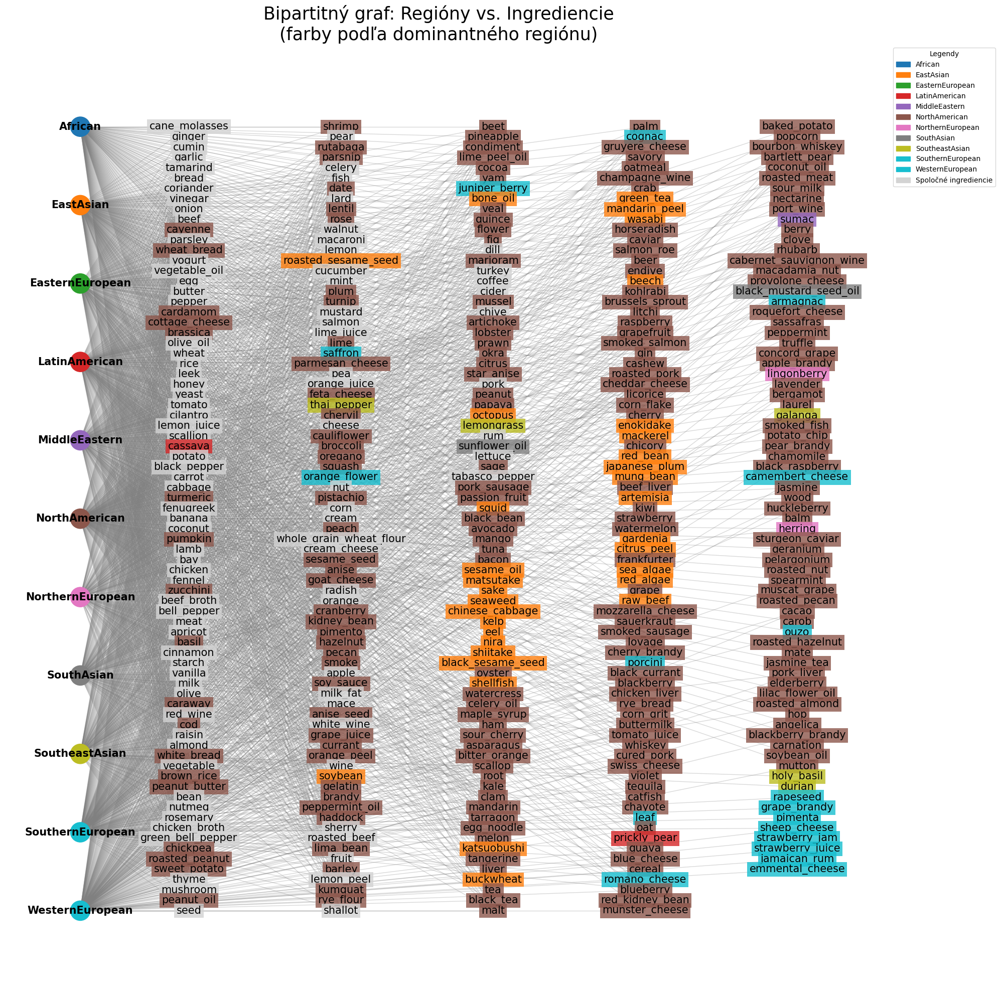

In [ ]:
Bf = B.copy()
region_nodes = [n for n,d in Bf.nodes(data=True) if d['bipartite']==0]
ing_nodes    = [n for n,d in Bf.nodes(data=True) if d['bipartite']==1]

pos = {}
for i, reg in enumerate(region_nodes):
    pos[reg] = (0.0, 1 - i/(len(region_nodes)-1 if len(region_nodes)>1 else 1))
n_cols = 5
col_w = 1.4
col_x = [1.0 + i*col_w for i in range(n_cols)]
chunk = math.ceil(len(ing_nodes)/n_cols)
for idx, ing in enumerate(ing_nodes):
    c = idx // chunk
    r = idx % chunk
    pos[ing] = (col_x[c], 1 - r/(chunk-1 if chunk>1 else 1))

cmap = plt.cm.get_cmap('tab10', len(region_nodes))
region_color_map = {reg: cmap(i) for i,reg in enumerate(region_nodes)}

plt.figure(figsize=(20,20))
nx.draw_networkx_edges(Bf, pos, edge_color='gray', alpha=0.3)

nx.draw_networkx_nodes(
    Bf, pos,
    nodelist=region_nodes,
    node_size=800,
    node_color=[region_color_map[r] for r in region_nodes]
)
nx.draw_networkx_labels(
    Bf, pos,
    labels={r:r for r in region_nodes},
    font_size=15,
    font_weight='bold'
)

all_regions = set(region_nodes)

for ing in ing_nodes:
    x, y = pos[ing]
    neighs = [(nbr, Bf[ing][nbr]['weight']) for nbr in Bf[ing] if nbr in region_nodes]
    neigh_regs = {nbr for nbr, w in neighs}

    if neigh_regs == all_regions:
        facecol = 'lightgrey'
    else:
        dom_reg = max(neighs, key=lambda x: x[1])[0]
        facecol = region_color_map[dom_reg]

    plt.text(
        x, y, ing,
        fontsize=15,
        ha='center', va='center',
        bbox=dict( boxstyle='square,pad=0.2', facecolor=facecol, edgecolor='none',alpha=0.8)
    )


handles = [ mpatches.Patch(color=col, label=reg) for reg, col in region_color_map.items()]

handles.append(mpatches.Patch(color='lightgrey', label='Spoločné ingrediencie'))

plt.legend(handles=handles,
           bbox_to_anchor=(1.02,1),
           loc='upper left',
           title='Legendy')

plt.title("Bipartitný graf: Regióny vs. Ingrediencie\n(farby podľa dominantného regiónu)", fontsize=25)
plt.axis('off')
plt.tight_layout()
plt.show()


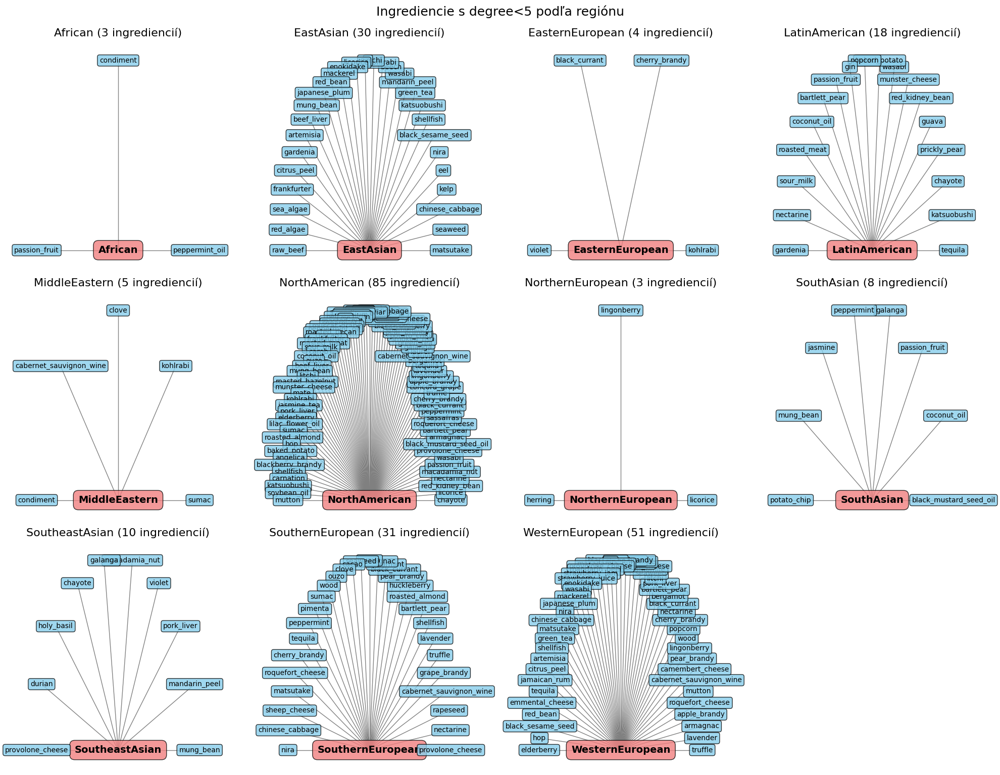

In [ ]:
ingredient_nodes = [n for n,d in B.nodes(data=True) if d['bipartite']==1]
region_nodes     = [n for n,d in B.nodes(data=True) if d['bipartite']==0]
ing_deg = {ing: B.degree(ing) for ing in ingredient_nodes}
ingredients_to_include = [ing for ing,deg in ing_deg.items() if deg < 5]

n_regions = len(region_nodes)
cols = 4
rows = math.ceil(n_regions/cols)
fig, axes = plt.subplots(rows, cols, figsize=(cols*5, rows*5), squeeze=False)

for ax, region in zip(axes.flatten(), region_nodes):
    neighs = [ing for ing in B.neighbors(region) if ing in ingredients_to_include]
    if not neighs:
        ax.set_axis_off()
        continue

    Gr = nx.Graph()
    Gr.add_node(region)
    for ing in neighs:
        Gr.add_node(ing)
        Gr.add_edge(region, ing)

    pos = {}
    pos[region] = np.array([0.0, 0.0])
    θ = np.linspace(0, np.pi, len(neighs))
    r = 1.5
    for i, ing in enumerate(neighs):
        pos[ing] = np.array([np.cos(θ[i]), np.sin(θ[i])]) * r
    nx.draw_networkx_edges(Gr, pos, ax=ax, edge_color='gray')
    ax.text(0, 0, region, #region
            fontsize=14, fontweight='bold',
            ha='center', va='center',
            bbox=dict(boxstyle='round,pad=0.5', facecolor='lightcoral', alpha=0.8))
    for ing in neighs: #infrediencie
        x, y = pos[ing]
        ax.text(x, y, ing,
                fontsize=10,
                ha='center', va='center',
                bbox=dict(boxstyle='round,pad=0.3', facecolor='skyblue', alpha=0.8))

    ax.set_title(f"{region} ({len(neighs)} ingrediencií)", fontsize=16)
    ax.set_axis_off()

for ax in axes.flatten()[n_regions:]:
    ax.set_axis_off()

plt.tight_layout()
plt.suptitle("Ingrediencie s degree<5 podľa regiónu", y=1.02, fontsize=18)
plt.show()


<ipython-input-18-407426dbb785>:24: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = plt.cm.get_cmap('tab20', len(region_nodes))


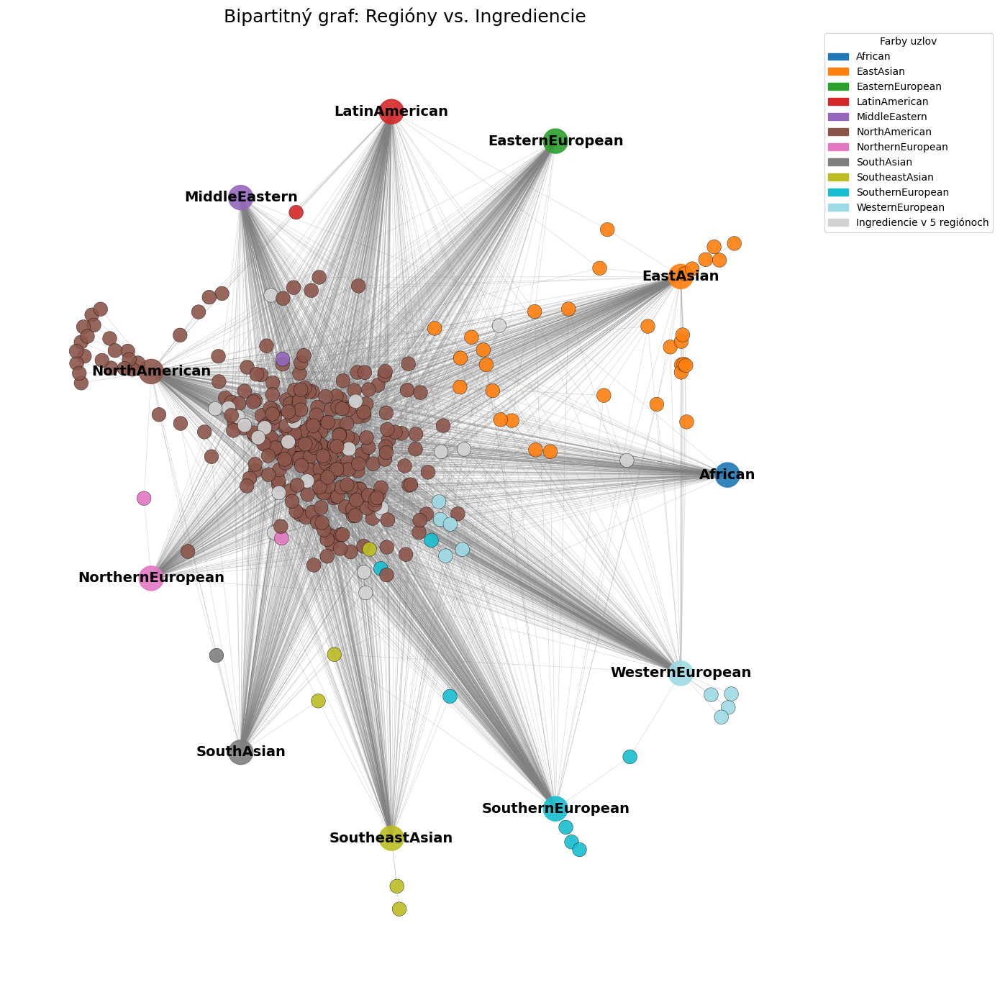

In [ ]:
region_nodes = [n for n,d in B.nodes(data=True) if d['bipartite']==0]
ing_nodes    = [n for n,d in B.nodes(data=True) if d['bipartite']==1]

radius = 20.0
theta = np.linspace(0, 2*np.pi, len(region_nodes), endpoint=False)
fixed_pos = {
    reg: np.array([np.cos(a), np.sin(a)]) * radius
    for reg, a in zip(region_nodes, theta)
}

pos = nx.spring_layout(
    B,
    pos=fixed_pos,
    fixed=region_nodes,
    k=1.0,
    iterations=200,
    seed=42
)

cmap = plt.cm.get_cmap('tab20', len(region_nodes))
region_color_map = {reg: cmap(i) for i, reg in enumerate(region_nodes)}

multi_color = 'lightgray'

#farba
ing_colors = []
for ing in ing_nodes:
    neighs = [nbr for nbr in B[ing] if nbr in region_nodes]
    deg = len(neighs)
    if deg == 1:
        ing_colors.append(region_color_map[neighs[0]])
    elif deg == 5:
        ing_colors.append(multi_color)
    else:
        wts = [(nbr, B[ing][nbr]['weight']) for nbr in neighs]
        dom = max(wts, key=lambda x: x[1])[0]
        ing_colors.append(region_color_map[dom])

plt.figure(figsize=(14,14))

nx.draw_networkx_edges( B, pos, edge_color='gray', alpha=0.3, width=0.5)

# regionálne uzly
nx.draw_networkx_nodes(B, pos,nodelist=region_nodes,node_size=600,node_color=[region_color_map[r] for r in region_nodes],alpha=0.9)
nx.draw_networkx_labels(B, pos,labels={r:r for r in region_nodes},font_size=14,font_weight='bold')

nx.draw_networkx_nodes(
    B, pos,
    nodelist=ing_nodes,
    node_size=200,
    node_color=ing_colors,
    edgecolors='black',
    linewidths=0.3,
    alpha=0.9
)

#legenda
handles = [mpatches.Patch(color=col, label=reg)
           for reg, col in region_color_map.items()]
handles.append(mpatches.Patch(color=multi_color, label='Ingrediencie v 5 regiónoch'))
plt.legend(
    handles=handles,
    bbox_to_anchor=(1.02,1),
    loc='upper left',
    title='Farby uzlov'
)

plt.title("Bipartitný graf: Regióny vs. Ingrediencie", fontsize=18)
plt.axis('off')
plt.tight_layout()
plt.show()


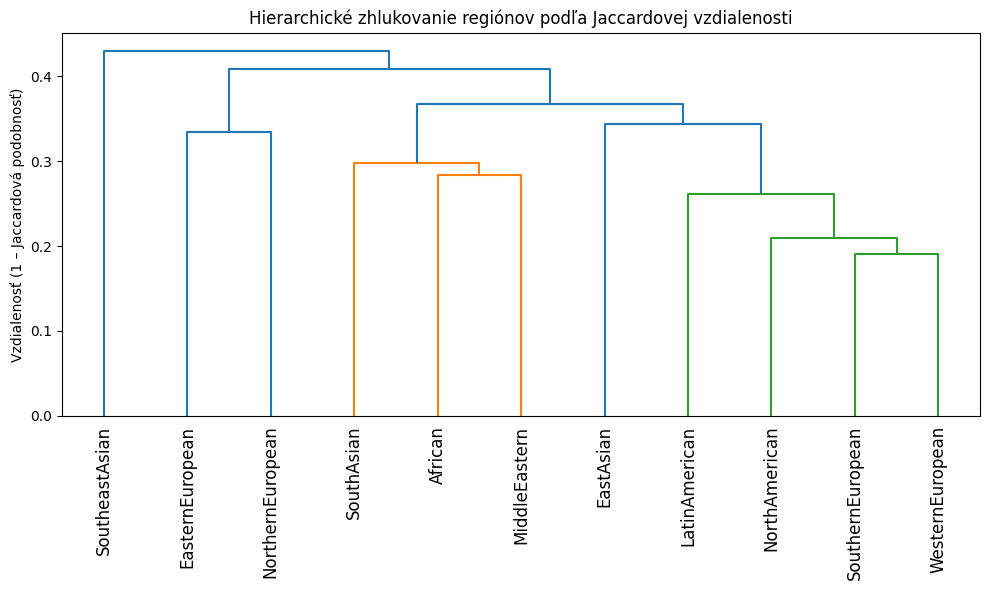

In [ ]:
#regiony
region_nodes = [n for n, d in Bf.nodes(data=True) if d['bipartite'] == 0]
region_ing = {
    reg: set(nbr for nbr in Bf.neighbors(reg) if Bf.nodes[nbr]['bipartite']==1)
    for reg in region_nodes
}

all_ings = sorted(set().union(*region_ing.values()))
mat = np.array([
    [1 if ing in region_ing[reg] else 0 for ing in all_ings]
    for reg in region_nodes])

distances = pdist(mat, metric='jaccard')

Z = sch.linkage(distances, method='average')

plt.figure(figsize=(10, 6))
sch.dendrogram(Z, labels=region_nodes, leaf_rotation=90)
plt.title("Hierarchické zhlukovanie regiónov podľa Jaccardovej vzdialenosti")
plt.ylabel("Vzdialenosť (1 – Jaccardová podobnosť)")
plt.tight_layout()
plt.show()


# Top 5 ingrediencii pre kazdy region

In [ ]:
#recipe per region
region_recipe_count = bipartite_df['Region'].value_counts()
ingredient_counts_per_region = {region: {} for region in region_recipe_count.index}

for region in bipartite_df['Region'].unique():
    region_data = bipartite_df[bipartite_df['Region'] == region]
    ingredients_in_region = region_data.iloc[:, 1:].stack() #flatten
    ingredient_counts = ingredients_in_region.value_counts()

    ingredient_counts_per_region[region] = ingredient_counts

#top 5
top_ingredients_per_region = {}
for region, ingredient_counts in ingredient_counts_per_region.items():
    total_recipes = region_recipe_count.get(region, 0)

    top_5_ingredients = ingredient_counts.head(5)

    ingredient_proportions = top_5_ingredients / total_recipes

    top_ingredients_per_region[region] = {
        'Number of Recipes': total_recipes,
        'Ingredients': top_5_ingredients.index.tolist(),
        'Count': top_5_ingredients.values.tolist(),
        'Proportion': ingredient_proportions.values.tolist()
    }



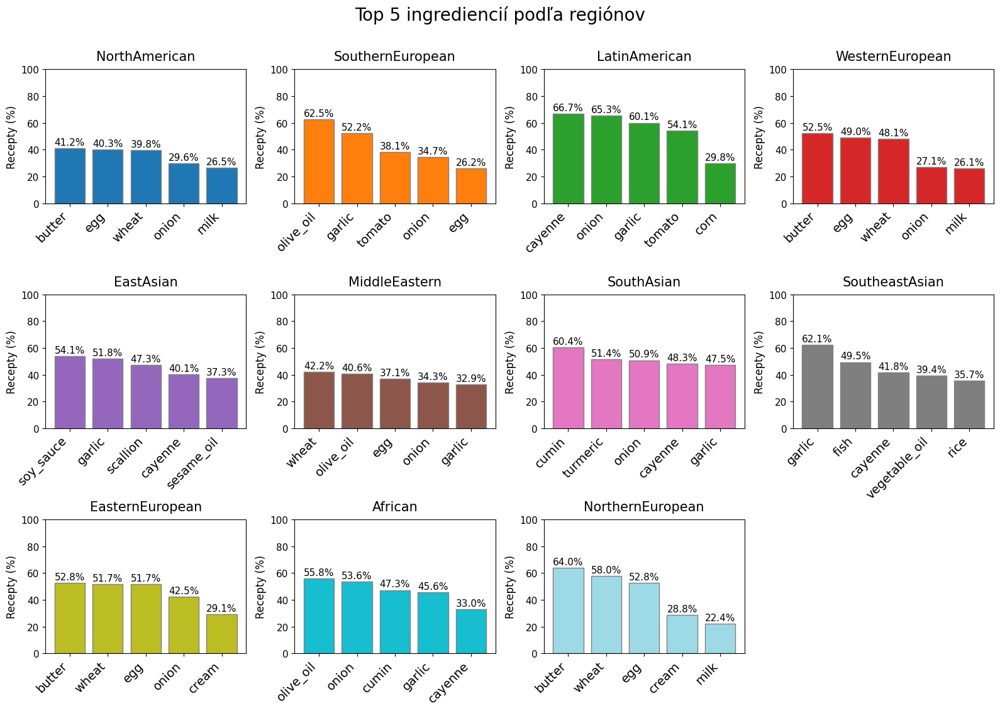

In [ ]:
regions = list(top_ingredients_per_region.keys())
n_regions = len(regions)

#rozlozeie
n_rows, n_cols = 3, 4
fig, axes = plt.subplots(n_rows, n_cols, figsize=(16, 12))
axes = axes.flatten()
colors = plt.cm.tab20(np.linspace(0, 1, n_regions))
region_colors = dict(zip(regions, colors))

for ax, region in zip(axes, regions):
    data = top_ingredients_per_region[region]
    ingredients = data['Ingredients']
    counts = data['Count']
    region_total = data['Number of Recipes']
    percents = [c / region_total * 100 for c in counts]


    bars = ax.bar(ingredients, percents, color=region_colors[region], edgecolor='grey')

    # popisy
    ax.set_xticks(range(len(ingredients)))
    ax.set_xticklabels(ingredients, ha='right', rotation = 45,  fontsize=14)
    ax.set_title(region, fontsize=15, pad=10)
    ax.set_yticks(np.arange(0, 101, 20))
    ax.set_ylabel("Recepty (%)", fontsize=12)
    ax.tick_params(axis='y', labelsize=11)

    for bar, pct in zip(bars, percents):
        height = bar.get_height()
        ax.text(
            bar.get_x() + bar.get_width()/2,
            height + 1,
            f"{pct:.1f}%",
            ha='center',
            va='bottom',
            fontsize=11
        )
3
for ax in axes[n_regions:]:
    ax.axis('off')

plt.suptitle("Top 5 ingrediencií podľa regiónov", fontsize=20, y=0.94)
plt.tight_layout(rect=[0, 0, 1, 0.93])
plt.show()


<ipython-input-31-ed7b45351019>:10: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  region_colors = cm.get_cmap('tab10', len(top_ingredients_per_region))


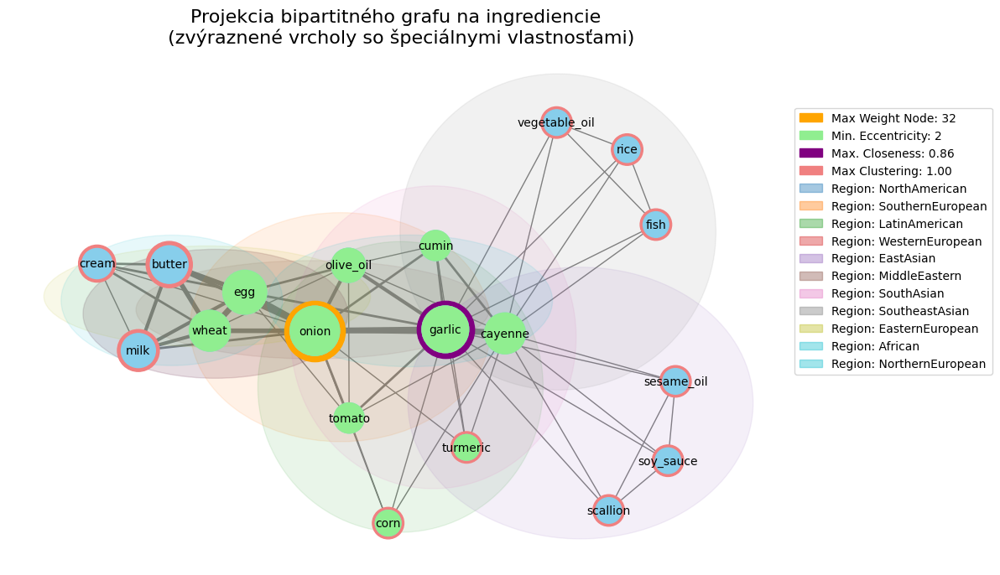

Node with maximum weight: onion (Weight: 32.00)
Nodes with minimum eccentricity: ['egg', 'wheat', 'onion', 'olive_oil', 'garlic', 'tomato', 'cayenne', 'corn', 'cumin', 'turmeric'] (Eccentricity: 2)
Nodes with maximum closeness centrality: ['garlic'] (Closeness Centrality: 0.8571)
Nodes with maximum clustering coefficient: ['butter', 'milk', 'corn', 'soy_sauce', 'scallion', 'sesame_oil', 'turmeric', 'fish', 'vegetable_oil', 'rice', 'cream'] (Clustering Coefficient: 1.0000)


In [ ]:
region_colors = cm.get_cmap('tab10', len(top_ingredients_per_region))

node_weights = {
    node: sum(data["weight"] for _, _, data in G_ingredient.edges(node, data=True))
    for node in G_ingredient.nodes()
}

# Normalize
max_node_weight = max(node_weights.values()) if node_weights else 1
node_sizes = {node: 300 + (weight / max_node_weight) * 1500 for node, weight in node_weights.items()}  # Scale sizes

#clustering
eccentricity = nx.eccentricity(G_ingredient)
closeness_centrality = nx.closeness_centrality(G_ingredient)
local_clustering = nx.clustering(G_ingredient)

max_weight_node = max(node_weights, key=node_weights.get)
max_weight_value = node_weights[max_weight_node]

max_clustering_value = max(local_clustering.values())
max_clustering_nodes = [
    node for node, coeff in local_clustering.items() if coeff == max_clustering_value
]

min_eccentricity_value = min(eccentricity.values())
min_eccentricity_nodes = [
    node for node, ecc in eccentricity.items() if ecc == min_eccentricity_value
]

max_closeness_value = max(closeness_centrality.values())
max_closeness_nodes = [
    node for node, cc in closeness_centrality.items() if cc == max_closeness_value
]

edge_weights = [data['weight'] for _, _, data in G_ingredient.edges(data=True)]
max_weight = max(edge_weights) if edge_weights else 1
edge_widths = [weight / max_weight * 5 for weight in edge_weights]


plt.figure(figsize=(12, 8))
pos = nx.spring_layout(G_ingredient, seed=42)

nx.draw_networkx_edges(
    G_ingredient,
    pos,
    width=edge_widths,
    edge_color="gray"
)

nx.draw_networkx_nodes(
    G_ingredient,
    pos,
    nodelist=[max_weight_node],
    node_color="orange",
    node_size=node_sizes[max_weight_node] * 1.5,
    label=f"Weight: {max_weight_value:.2f}"
)

nx.draw_networkx_nodes(
    G_ingredient,
    pos,
    nodelist=max_closeness_nodes,
    node_color="purple",
    node_size=[node_sizes[node] * 1.5 for node in max_closeness_nodes],
    label=f"Max Closeness: {max_closeness_value:.4f} (Nodes: {len(max_closeness_nodes)})"
)

nx.draw_networkx_nodes(
    G_ingredient,
    pos,
    nodelist=max_clustering_nodes,
    node_color="lightcoral",
    node_size=[node_sizes[node] * 1.5 for node in max_clustering_nodes],
    label=f"Max Clustering: {max_clustering_value:.4f} (Nodes: {len(max_clustering_nodes)})"
)

nx.draw_networkx_nodes(
    G_ingredient,
    pos,
    node_size=[node_sizes[node] for node in G_ingredient.nodes()],
    node_color="skyblue",
)

nx.draw_networkx_nodes(
    G_ingredient,
    pos,
    nodelist=min_eccentricity_nodes,
    node_color="lightgreen",
    node_size=[node_sizes[node] for node in min_eccentricity_nodes],
    label=f"Min Eccentricity: {min_eccentricity_value} (Nodes: {len(min_eccentricity_nodes)})"
)

ax = plt.gca()
for idx, (region, data) in enumerate(top_ingredients_per_region.items()):
    region_positions = [pos[ingredient] for ingredient in data['Ingredients'] if ingredient in pos]
    if region_positions:
        x_coords, y_coords = zip(*region_positions)
        center_x = sum(x_coords) / len(x_coords)
        center_y = sum(y_coords) / len(y_coords)
        width = (max(x_coords) - min(x_coords)) * 1.5
        height = (max(y_coords) - min(y_coords)) * 1.5
        ellipse = Ellipse(
            (center_x, center_y), width=width, height=height,
            edgecolor=region_colors(idx), facecolor=region_colors(idx, alpha=0.1),
            label=f"Region: {region}", alpha=0.1
        )
        ax.add_patch(ellipse)

# labels
nx.draw_networkx_labels(
    G_ingredient,
    pos,
    font_size=10,
    font_color="black"
)

legend_elements = [
    mpatches.Circle((0, 0), radius=1, color="orange", label=f"Max Weight Node: {max_weight_value}"),
    mpatches.Circle((0, 0), radius=1, color="lightgreen", label=f"Min. Eccentricity: {min_eccentricity_value}"),
    mpatches.Circle((0, 0), radius=1, color="purple", label=f"Max. Closeness: {max_closeness_value:.2f}"),
    mpatches.Circle((0, 0), radius=1, color="lightcoral", label=f"Max Clustering: {max_clustering_value:.2f}")
]

region_legend_elements = [
    mpatches.Patch(
        color=region_colors(idx, alpha=0.4),
        label=f"Region: {region}"
    )
    for idx, region in enumerate(top_ingredients_per_region.keys())
]


combined_legend_elements = legend_elements + region_legend_elements
plt.legend(handles=combined_legend_elements, loc="best", fontsize=10,bbox_to_anchor=(1, 0.9))
plt.title("Projekcia bipartitného grafu na ingrediencie \n (zvýraznené vrcholy so špeciálnymi vlastnosťami)", fontsize=16)
plt.axis("off")

plt.show()

print(f"Node with maximum weight: {max_weight_node} (Weight: {max_weight_value:.2f})")
print(f"Nodes with minimum eccentricity: {min_eccentricity_nodes} (Eccentricity: {min_eccentricity_value})")
print(f"Nodes with maximum closeness centrality: {max_closeness_nodes} (Closeness Centrality: {max_closeness_value:.4f})")
print(f"Nodes with maximum clustering coefficient: {max_clustering_nodes} (Clustering Coefficient: {max_clustering_value:.4f})")


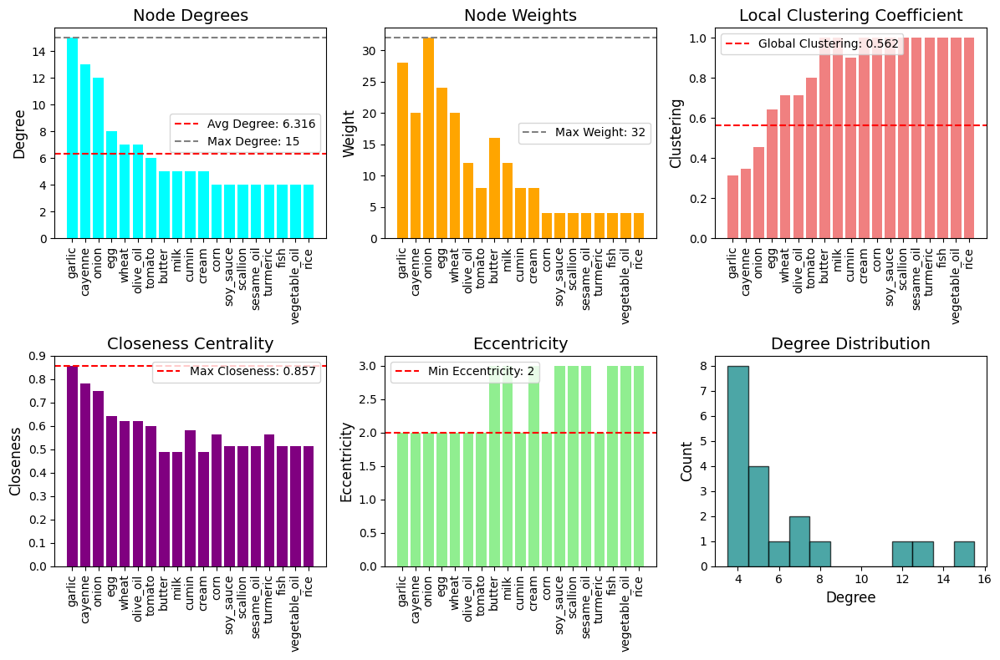

In [ ]:
node_degrees = dict(G_ingredient.degree())


sorted_nodes = sorted(node_degrees.keys(), key=lambda node: node_degrees[node], reverse=True)
sorted_node_weights = {node: node_weights[node] for node in sorted_nodes}


local_clustering = nx.clustering(G_ingredient)
sorted_local_clustering = {node: local_clustering[node] for node in sorted_nodes}
global_clustering_coefficient = nx.transitivity(G_ingredient)

#  centralitu blízkosti
closeness_centrality = nx.closeness_centrality(G_ingredient)
sorted_closeness_centrality = {node: closeness_centrality[node] for node in sorted_nodes}

#  excentricitu
eccentricity = nx.eccentricity(G_ingredient)
sorted_eccentricity = {node: eccentricity[node] for node in sorted_nodes}

nodes = sorted_nodes
degrees = [node_degrees[node] for node in nodes]
weights = [sorted_node_weights[node] for node in nodes]
clustering = [sorted_local_clustering[node] for node in nodes]
closeness = [sorted_closeness_centrality[node] for node in nodes]
eccentricity_values = [sorted_eccentricity[node] for node in nodes]

plt.figure(figsize=(12, 8))

# 1. Subgraf: Stupne vrcholov
plt.subplot(2, 3, 1)
plt.bar(nodes, degrees, color='cyan')
plt.title('Node Degrees', fontsize=14)
plt.ylabel('Degree', fontsize=12)
plt.axhline(y=np.mean(degrees), color='red', linestyle='--', label=f'Avg Degree: {np.mean(degrees):.3f}')
plt.axhline(y=np.max(degrees), color='grey', linestyle='--', label=f'Max Degree: {np.max(degrees):.0f}')
plt.xticks(rotation=90)
plt.legend()

# 2. Subgraf: Váha vrcholov
plt.subplot(2, 3, 2)
plt.bar(nodes, weights, color='orange')
plt.title('Node Weights', fontsize=14)
plt.axhline(y=np.max(weights), color='grey', linestyle='--', label=f'Max Weight: {np.max(weights):.0f}')
plt.ylabel('Weight', fontsize=12)
plt.xticks(rotation=90)
plt.legend()

# 3. Subgraf: Lokálny zhlukový koeficient
plt.subplot(2, 3, 3)
plt.bar(nodes, clustering, color='lightcoral')
plt.axhline(y=global_clustering_coefficient, color='red', linestyle='--', label=f'Global Clustering: {global_clustering_coefficient:.3f}')
plt.title('Local Clustering Coefficient', fontsize=14)
plt.ylabel('Clustering', fontsize=12)
plt.xticks(rotation=90)
plt.legend()

# 4. Subgraf: Centralita blízkosti
plt.subplot(2, 3, 4)
plt.bar(nodes, closeness, color='purple')
plt.axhline(y=max(closeness), color='red', linestyle='--', label=f'Max Closeness: {max(closeness):.3f}')
plt.title('Closeness Centrality', fontsize=14)
plt.ylabel('Closeness', fontsize=12)
plt.xticks(rotation=90)
plt.legend()

# 5. Subgraf: Excentricita
plt.subplot(2, 3, 5)
plt.bar(nodes, eccentricity_values, color='lightgreen')
plt.axhline(y=min(eccentricity_values), color='red', linestyle='--', label=f'Min Eccentricity: {min(eccentricity_values):.0f}')
plt.title('Eccentricity', fontsize=14)
plt.ylabel('Eccentricity', fontsize=12)
plt.xticks(rotation=90)
plt.legend()

# 6. Subgraf: Distribúcia stupňov uzlov (degree distribution)
plt.subplot(2, 3, 6)
plt.hist(degrees, bins=np.arange(min(degrees) - 0.5, max(degrees) + 1.5, 1), color='teal', edgecolor='black', alpha=0.7)
plt.title('Degree Distribution', fontsize=14)
plt.xlabel('Degree', fontsize=12)
plt.ylabel('Count', fontsize=12)

plt.tight_layout()

plt.show()
